In [6]:
import warnings
warnings.filterwarnings('ignore',category=RuntimeWarning)
import xarray as xr
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import glob,os,sys
from tqdm.auto import tqdm
import proplot as plot
import json,pickle
import dask.array as da
import gc
from sklearn.decomposition import PCA
sys.path.insert(1, '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/')
from tools import derive_var,read_and_proc,preproc_noensemble
from tools.mlr import mlr,proc_mlrfcst,maria_IO,ffs
from tools.preprocess import do_eof,preproc_maria,preproc_haiyan
sys.path.insert(2, '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/testML/')
import feature_select
from dask.distributed import Client
client = Client(processes=True, threads_per_worker=1,n_workers=2)
%matplotlib inline
plot.rc.update({'figure.facecolor':'w','axes.labelweight':'ultralight',
                'tick.labelweight':'ultralight','gridminor.linestyle':'--','title.weight':'normal','linewidth':0.5})

/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36237 instead
  warnings.warn(
/tmp/ipykernel_4161784/1099128259.py:24: ProplotWarning: rc setting 'linewidth' was renamed to 'meta.width' in version 0.8.
  plot.rc.update({'figure.facecolor':'w','axes.labelweight':'ultralight',


#### Read data

In [2]:
path = '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/'
suffix = '_smooth_preproc_dict1b_g'
a = [read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['u'].shape for lime in tqdm(range(1,21))]
# divide experiments reference
divider = np.asarray([aobj[0] for aobj in a]).cumsum()

haiyan_u = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['u'] for lime in tqdm(range(1,21))],axis=0)
haiyan_v = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['v'] for lime in tqdm(range(1,21))],axis=0)
haiyan_w = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['w'] for lime in tqdm(range(1,21))],axis=0)
haiyan_qv = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['qv'] for lime in tqdm(range(1,21))],axis=0)
haiyan_theta = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['theta'] for lime in tqdm(range(1,21))],axis=0)
haiyan_heatsum = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['heatsum'] for lime in tqdm(range(1,21))],axis=0)
haiyan_hdia = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['hdia'] for lime in tqdm(range(1,21))],axis=0)
haiyan_rad = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['rad'] for lime in tqdm(range(1,21))],axis=0)
haiyan_ir = np.concatenate([read_and_proc.depickle(path+'TCGphy/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['ir'] for lime in tqdm(range(1,21))],axis=0)

folderpath='/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/testML/output/haiyan/processed/'
PCAdict,dict2 = read_and_proc.depickle(folderpath+'pca/PCA'+'_'+'dict1_g'),read_and_proc.depickle(folderpath+'pca/PCA'+'_'+'dict2_g') #dict1: u,v,w,theta,hdia,rad; dict2:qv,ir
PCAdict['qv'] = (dict2['qv'])
PCAdict['ir'] = (dict2['ir'])

dims = ['sample','flatarray']
coords = dict(sample=np.linspace(0,haiyan_u.shape[0]-1,haiyan_u.shape[0]),flatarray=np.linspace(0,haiyan_u.shape[1]-1,haiyan_u.shape[1]))

ds = xr.Dataset(coords=coords)
haiyan_data=preproc_haiyan.build_a_xarray_dataset(ds=ds,varname=['u','v','w','theta','heatsum','hdia','rad','qv','ir'],\
                                   varfile=[haiyan_u,haiyan_v,haiyan_w,haiyan_theta,haiyan_heatsum,haiyan_hdia,haiyan_rad,haiyan_qv,haiyan_ir],dims=dims,coords=coords)
del haiyan_u,haiyan_v,haiyan_w,haiyan_theta,haiyan_heatsum,haiyan_hdia,haiyan_rad
gc.collect()

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

220

##### Random X,y read

In [7]:
folderpath='/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/testML/output/haiyan/processed/'
def _get_exp_name(splitnum=None,folder=2):
    return sorted(glob.glob(folderpath+'pca/X/random/'+str(folder)+'/Xtrain*'))[splitnum][:-7].split('/')[-1][6:],sorted(glob.glob(folderpath+'pca/X/random/'+str(folder)+'/Xtrain*'))[splitnum][:-7].split('/')[-1][6:].split('_')
def real_random(index=None,folder=2):
    toextract = _get_exp_name(index,folder)[0]
    # X
    Xtestpath,Xtrainpath,Xvalidpath = sorted(glob.glob(folderpath+'pca/X/random/'+str(folder)+'/*'+str(toextract)+'*'))
    Xtest,Xtrain,Xvalid = [read_and_proc.depickle(obj) for obj in[Xtestpath,Xtrainpath,Xvalidpath]]
    # y
    yallpath = sorted(glob.glob(folderpath+'pca/y/random/'+str(folder)+'/*'+str(toextract)+'*'))
    yall = read_and_proc.depickle(yallpath[0])
    return Xtest,Xtrain,Xvalid,yall

In [8]:
Xtest,Xtrain,Xvalid = [],[],[]
yall = []

for i in tqdm(range(33)):
    temp1,temp2,temp3,temp4 = real_random(i,3)
    Xtest.append(temp1)
    Xtrain.append(temp2)
    Xvalid.append(temp3)
    yall.append(temp4)

  0%|          | 0/33 [00:00<?, ?it/s]

#### Import real du/dv data (for R2)

In [9]:
def forward_diff(arrayin=None,delta=None,axis=None,LT=1):
    result = []
    if axis==0:
        for i in range(0,arrayin.shape[axis]-LT):
            temp = (arrayin[i+LT,:]-arrayin[i,:])/(LT*delta)
            result.append(temp)
        return np.asarray(result)
    
class retrieve_cartesian:
    def __init__(self,PCA_dict=None,Af_dict=None,numcomp=[11,11,15],LT=None,forecastPC=None,target='all',suffix=None):
        self.PCA_dict=PCA_dict
        self.numcomp=numcomp
        self.forecastPC = forecastPC
        self.LT = LT
        self.target=target
        self.suffix=suffix
        
    def get_time_diff_terms(self,inputvar=None,LT=None,wantvar=None):
        def _get_time_diff(array=None,timedelta=60*60,LT=None):
            store = []
            for exp in array:
                a = forward_diff(exp,timedelta,0,LT)
                if a.shape[0]>0:
                    azero = np.zeros((LT,exp.shape[-1]))
                    store.append(np.asarray(a))
                    #store.append(np.concatenate((a,azero),axis=0))
                else:
                    continue
                    #store.append(np.zeros((exp.shape[0],exp.shape[-1])))
            return store
        
        storedict = {}
        for wantvarZ,wantvarN in enumerate(wantvar):
            storedict[wantvarN] = _get_time_diff(array=inputvar[wantvarZ],LT=LT)
        return storedict
    
    def _pop_valid_test(self,examplist=None,validindex=None,testindex=None):
        [examplist.pop(i) for i in validindex]
        [examplist.pop(i) for i in testindex]
        return None
        
    def windrates_real(self,uvwheatpath=None,LT=None,category='train',validindex=[1,6],testindex=[2,12]):
        u = [read_and_proc.depickle(path+uvwheatpath+'mem'+str(lime)+self.suffix)['u'] for lime in (range(1,21))].copy()
        v = [read_and_proc.depickle(path+uvwheatpath+'mem'+str(lime)+self.suffix)['v'] for lime in (range(1,21))].copy()
        w = [read_and_proc.depickle(path+uvwheatpath+'mem'+str(lime)+self.suffix)['w'] for lime in (range(1,21))].copy()
        theta = [read_and_proc.depickle(path+uvwheatpath+'mem'+str(lime)+self.suffix)['theta'] for lime in (range(1,21))].copy()
        
        if category=='train':
            popindex = validindex+testindex
            ut = [u[i] for i in range(len(u)) if i not in popindex]
            vt = [v[i] for i in range(len(v)) if i not in popindex]
            wt = [w[i] for i in range(len(w)) if i not in popindex]
            thetat = [theta[i] for i in range(len(theta)) if i not in popindex]
            #self._pop_valid_test(u,validindex,testindex)
            #self._pop_valid_test(v,validindex,testindex)
            #self._pop_valid_test(w,validindex,testindex)
            #self._pop_valid_test(theta,validindex,testindex)
            assert len(ut)==16, 'wrong train-valid-test separation!'
            dtermsT = self.get_time_diff_terms(inputvar=[ut,vt,wt,thetat],LT=LT,wantvar=['u','v','w','theta'])
        elif category=='valid':
            uv = [u[index] for index in validindex]
            vv = [v[index] for index in validindex]
            wv = [w[index] for index in validindex]
            thetav = [theta[index] for index in validindex]
            del u,v,w,theta
            gc.collect()
            dtermsT = self.get_time_diff_terms(inputvar=[uv,vv,wv,thetav],LT=LT,wantvar=['u','v','w','theta'])
        elif category=='test':
            ut = [u[index] for index in testindex]
            vt = [v[index] for index in testindex]
            wt = [w[index] for index in testindex]
            thetat = [theta[index] for index in testindex]            
            del u,v,w,theta
            gc.collect()
            dtermsT = self.get_time_diff_terms(inputvar=[ut,vt,wt,thetat],LT=LT,wantvar=['u','v','w','theta'])            
        
        dudt = np.concatenate([testx for testx in dtermsT['u']],axis=0)
        dvdt = np.concatenate([testx for testx in dtermsT['v']],axis=0)
        dwdt = np.concatenate([testx for testx in dtermsT['w']],axis=0)
        dthdt = np.concatenate([testx for testx in dtermsT['theta']],axis=0)
        del dtermsT
        gc.collect()
        return dudt,dvdt,dwdt,dthdt
    
    def output_reshapeRECON(self,forecast_eig=None):
        if (self.target=='surface') or (self.target=='alluv'):
            testrec_dudt = np.dot(forecast_eig[:,0:self.numcomp[0]],(self.PCA_dict['u'].components_[0:self.numcomp[0]]))#.reshape((91,39,360,167))
            testrec_dvdt = np.dot(forecast_eig[:,self.numcomp[0]:self.numcomp[0]+self.numcomp[1]],(self.PCA_dict['v'].components_[0:self.numcomp[1]]))#.reshape((91,39,360,167))
            return testrec_dudt,testrec_dvdt
        else:
            testrec_dudt = np.dot(forecast_eig[:,0:self.numcomp[0]],(self.PCA_dict['u'].components_[0:self.numcomp[0]]))#.reshape((91,39,360,167))
            testrec_dvdt = np.dot(forecast_eig[:,self.numcomp[0]:self.numcomp[0]+self.numcomp[1]],(self.PCA_dict['v'].components_[0:self.numcomp[1]]))#.reshape((91,39,360,167))
            testrec_dwdt = np.dot(forecast_eig[:,self.numcomp[0]+self.numcomp[1]:self.numcomp[0]+self.numcomp[1]+self.numcomp[2]],(self.PCA_dict['w'].components_[0:self.numcomp[2]]))#.reshape((39,360,167))
            testrec_dthdt = np.dot(forecast_eig[:,self.numcomp[0]+self.numcomp[1]+self.numcomp[2]:],(self.PCA_dict['theta'].components_[0:self.numcomp[3]]))#.reshape((39,360,167))
            return testrec_dudt,testrec_dvdt,testrec_dwdt,testrec_dthdt
        
    def conversion_predictPC(self,yforecast=None,mshpe=[39,360,167]):
        if self.target=='surface':
            t1,t2 = self.output_reshapeRECON(forecast_eig=yforecast)
            return (t1.reshape(t1.shape[0],mshpe[0],mshpe[1],mshpe[2])[:,0,:,:]).reshape(t1.shape[0],mshpe[1]*mshpe[2]),(t2.reshape(t2.shape[0],mshpe[0],mshpe[1],mshpe[2])[:,0,:,:]).reshape(t2.shape[0],mshpe[1]*mshpe[2])
        elif self.target=='alluv':
            t1,t2 = self.output_reshapeRECON(forecast_eig=yforecast)
            return t1,t2
        elif self.target=='all': 
            t1,t2,t3,t4 = self.output_reshapeRECON(forecast_eig=yforecast)
            return t1,t2,t3,t4
        
    def output_r2(self,FFWmodels=None,reducedX=None,realU=None,realV=None,realW=None,realTH=None,case='Haiyan'):
        yf = [models.predict(Xns) for (models,Xns) in zip(FFWmodels[:],reducedX[:])]
        mlr_r2 = []
        for i in (range(45)):#len(yf))):
            if case=='Maria':
                temp1,temp2 = self.conversion_predictPC(yforecast=yf[i],mshpe=[39,360,167])
                mlr_r2.append(r2_score(np.concatenate((realU,realV),axis=0),np.concatenate((temp1,temp2),axis=0)))
            elif case=='Haiyan':
                try:
                    temp1,temp2 = self.conversion_predictPC(yforecast=yf[i],mshpe=[10,360,208])
                    a = r2_score(np.concatenate((realU,realV),axis=0),np.concatenate((temp1,temp2),axis=0))
                    print(a)
                    mlr_r2.append(a)
                except:
                    temp1,temp2,temp3,temp4 = self.conversion_predictPC(yforecast=yf[i],mshpe=[10,360,208])
                    print(temp1.shape,temp2.shape,temp3.shape,temp4.shape)
                    a = r2_score(np.concatenate((realU,realV,realW,realTH),axis=0),np.concatenate((temp1,temp2,temp3,temp4),axis=0))
                    print(a)
                    mlr_r2.append(a)
            del temp1,temp2
            gc.collect()
        return mlr_r2

In [37]:
train_realUV,valid_realUV,test_realUV = [],[],[]
for i in tqdm(range(2)):
    tempindex = _get_exp_name(i,3)[1]
    validindex,testindex = [int(tempindex[0]),int(tempindex[1])],[int(tempindex[2]),int(tempindex[3])]
    print(tempindex)
    break
    obj1,obj2,obj3 = random_FFT(validindex,testindex,4,24).separate_realall(vertshape=10)
    train_realUV.append(obj1)
    valid_realUV.append(obj2)
    test_realUV.append(obj3)

  0%|          | 0/2 [00:00<?, ?it/s]

['11', '5', '13', '8']


#### Train

In [10]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectorMixin
from sklearn.metrics import r2_score
from sklearn.base import BaseEstimator, MetaEstimatorMixin, clone
from sklearn.model_selection import cross_val_score
import numpy as np
import gc
import importlib
importlib.reload(proc_mlrfcst)
importlib.reload(mlr)

In [16]:
INPUT,_,_ = random_FFT(None,None,4,24).preproc_INOUT(yall=yall[0],Xtrain=Xtrain[i],expTYPE='dtthuvwqv',nummem=[50,38,91,8])

In [18]:
INPUT,_,_ = random_FFT(None,None,4,24).preproc_INOUT(yall=yall[0],Xtrain=Xtrain[i],expTYPE='dtthuvwqv',nummem=[50,38,91,8])
del INPUT
gc.collect()

682

In [ ]:
model_FFW,reducedX_FFW,newfeature_FFW = [],[],[]
for i in (range(33)):
    tempindex = _get_exp_name(i,3)[1]
    validindex,testindex = [int(tempindex[0]),int(tempindex[1])],[int(tempindex[2]),int(tempindex[3])]
    obj1,obj2,obj3 = ffs.random_FFT(validindex,testindex,4,24).do_seq_FS(data=haiyan_data,yall=yall[i],Xtrain=Xtrain[i],Xvalid=Xvalid[i],expTYPE='dtthuvwqv',findextra=30,cv=7,nummem=[50,38,91,8],
                                                                    holdmem=[297, 298, 299, 300, 301, 302, 303, 304, 305, 306],optimizeto='valid')
    model_FFW.append(obj1)
    reducedX_FFW.append(obj2)
    newfeature_FFW.append(obj3)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defin

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/miniconda3/envs/fred_workenv/lib/python3.9/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defin

In [35]:
nummem = [50,38,91,8]
r2_train = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=24,forecastPC=None,target='all',\
                              suffix=suffix).output_r2(FFWmodels=model_FFW[0],reducedX=reducedX_FFW[0],realU=train_realUV[0]['u'],realV=train_realUV[0]['v'],realW=train_realUV[0]['w'],realTH=train_realUV[0]['theta'],case='Haiyan')

(863, 748800) (863, 748800) (863, 748800) (863, 748800)


ValueError: Found input variables with inconsistent numbers of samples: [3632, 3452]

In [ ]:
lti=24
read_and_proc.save_to_pickle('../../output/haiyan/processed/pca/FFW/random/'+str(lti)+'/FFWmodels3_cross7_0_33',model_FFW,'PICKLE')
read_and_proc.save_to_pickle('../../output/haiyan/processed/pca/FFW/random/'+str(lti)+'/newfeature3_cross7_0_33',newfeature_FFW,'PICKLE')
read_and_proc.save_to_pickle('../../output/haiyan/processed/pca/FFW/random/'+str(lti)+'/reducedX3_cross7_0_33',reducedX_FFW,'PICKLE')

In [48]:
def feature_importance_from_mlr(MODEL=None,smallX=None):
    def _get_feature_importance(WEIGHTx=None,smallXx=None):
        return np.nanmean(np.asarray([temp*smallXx for temp in WEIGHTx]),axis=1)
    weight = MODEL.coef_
    #WEIGHTZ = np.zeros_like(weight)
    return np.asarray([_get_feature_importance(weight[:,weightz],smallX[:,weightz]) for weightz in range(smallX.shape[1])])
ensemble_weights = [feature_importance_from_mlr(MODEL=model_FFW[0][i],smallX=reducedX_FFW[0][i]) for i in range(10)]

/tmp/ipykernel_2847202/3221861949.py:3: ProplotWarning: rc setting 'linewidth' was renamed to 'meta.width' in version 0.8.
  plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'k','title.color':'w','fontname': 'Source Sans Pro', 'fontsize': 11,'linewidth':1.25})


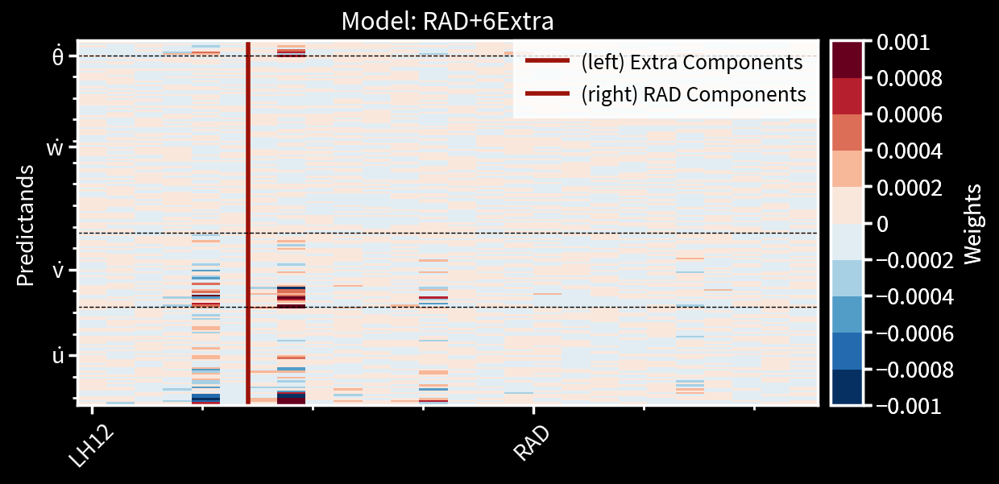

In [49]:
i=5
plot.rc.metacolor = 'w'
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'k','title.color':'w','fontname': 'Source Sans Pro', 'fontsize': 11,'linewidth':1.25})
plot.rc.axesfacecolor = 'k'
from matplotlib.lines import Line2D
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.595,refaspect=2.031)
l = axs[0].pcolormesh(np.linspace(0,20+i,21+i)-0.5,np.linspace(0,186,187),ensemble_weights[i].transpose(),cmap='BuRd',vmin=-0.001,vmax=0.001)
#axs.format(ylabel='Predictands',xticks=[-0.5,1-0.5,2-0.5,3-0.5,4-0.5,5-0.5,10+i],yticks=[25,69,132,179],yticklabels=['$\dot{u}$','$\dot{v}$','$\dot{w}$',r'$\dot{\theta}$'],\
#          xticklabels=['U8','U27','V22','LH5','LH8','LH12','RAD'],title=f'Model: RAD+{i+1}Extra')
axs.format(ylabel='Predictands',xticks=[-0.5,10+i],yticks=[25,69,132,179],yticklabels=['$\dot{u}$','$\dot{v}$','$\dot{w}$',r'$\dot{\theta}$'],\
          xticklabels=['LH12','RAD'],title=f'Model: RAD+{i+1}Extra')
l2 = axs[0].axvline(i,lw=2,color='#9c1309')
for ix in [50,88,179]:
    axs[0].axhline(ix,lw=0.5,color='k',ls='--')
custom_lines = [Line2D([0], [0], color='#9c1309', lw=2),Line2D([0], [0], color='#9c1309', lw=2)]
axs[0].legend(custom_lines, ['(left) Extra Components', '(right) RAD Components'],loc='ur',ncols=1,prop={'size':10})
plt.colorbar(l,ax=axs[0],label='Weights')
for tick in axs[0].get_xticklabels():
    tick.set_rotation(45)
#plt.savefig('../figures/0430/weights_'+str(i)+'.png',dpi=300,facecolor=fig.get_facecolor())
plt.show()

In [18]:
read_and_proc.save_to_pickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/random/FFWmodels_cross7_'+str(toextract),model,'PICKLE')
read_and_proc.save_to_pickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/random/newfeature_cross7_'+str(toextract),new_feature,'PICKLE')
read_and_proc.save_to_pickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/random/reducedX_cross7_'+str(toextract),reducedX,'PICKLE')

#### Read saved models

In [10]:
lti = 6
model = read_and_proc.depickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/FFWmodels_cross7')
new_feature = read_and_proc.depickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/newfeature_cross7')
reducedX = read_and_proc.depickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/reducedX_cross7')

model_c3 = read_and_proc.depickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/FFWmodels_cross5')
new_feature_c3 = read_and_proc.depickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/newfeature_cross5')
reducedX_c3 = read_and_proc.depickle('../../output/haiyan/processed/pca/FFW/'+str(lti)+'/reducedX_cross5')

In [21]:
nummem = [50,38,91,8]
r2_train = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='surface',\
                              suffix=suffix).output_r2(FFWmodels=model,reducedX=reducedX,realU=realsurfu,realV=realsurfv,case='Haiyan')
#r2_train = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='alluv',\
#                              suffix=suffix).output_r2(FFWmodels=model,reducedX=reducedX,realU=realdu,realV=realdv,case='Haiyan')
#r2_train = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='all',\
#                              suffix=suffix).output_r2(FFWmodels=model,reducedX=reducedX,realU=realdu,realV=realdv,realW=realdw,realTH=realdtheta,case='Haiyan')

distributed.nanny - WARNING - Worker process still alive after 3 seconds, killing
distributed.nanny - WARNING - Worker process still alive after 3 seconds, killing


0.2634551047606449
0.27020786550722103
0.2771174692913796
0.29057951006821825
0.29825284911850874
0.30505271041551524
0.30896605432717245
0.3141786687344694
0.3231780727391649
0.32622472718727524
0.3313512732759336
0.3329495397083474
0.34271340526877225
0.3482809468249231
0.3512978786640362
0.35467414220524324
0.3592344642365194
0.36116288503177896
0.36312621822650926
0.3670583106997508
0.36895199539757684
0.3712748899363604
0.37316463791646465
0.3769071548964922
0.3783003736165651
0.3810760622980489
0.386827648727652
0.3944623001333795
0.3971853456252211
0.4012105234477641
0.4071097822015975
0.4101471815018739
0.4116402985392923
0.41437329073113094
0.41681223565223025
0.4195303493010772
0.42155323624166036
0.42267971845499
0.42858726269356695
0.4298231148018404
0.4347064125199097
0.4369812891975525
0.43918871242025814
0.4421947154760336
0.4442656825803556


#### Valid

In [22]:
yvalid = [yobj[1] for yobj in yall]
mlrIN_v,mlrOUT_v = mlr.SimpleIOhandler(LT=lti,auxIN=None).transform(Xvalid['dtthuvw'],yvalid)

loc = [int(obj) for obj in list(np.transpose(np.linspace(269,289-1,20)))]
loopfeature = [np.asarray(loc.copy())]
for i in range(len(new_feature_c3)):
    loopfeature.append(np.append(loopfeature[i],new_feature_c3[i]))
    
reducedX_valid = [np.asarray(mlrIN_v)[:,sorted(loopfeature[i])] for i in range(len(loopfeature))]
r2_valid = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='surface',\
                              suffix=suffix).output_r2(FFWmodels=model_c3,reducedX=reducedX_valid[1:],realU=realsurfu_valid,\
                                                       realV=realsurfv_valid,case='Haiyan')
#r2_valid = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='alluv',\
#                              suffix=suffix).output_r2(FFWmodels=model,reducedX=reducedX_valid[1:],realU=realdu_valid,\
#                                                       realV=realdv_valid,case='Haiyan')
#r2_valid = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='all',\
#                              suffix=suffix).output_r2(FFWmodels=model_c3,reducedX=reducedX_valid[1:],realU=realdu_valid,realW=realdw_valid,realTH=realdtheta_valid,\
#                                                       realV=realdv_valid,case='Haiyan')

0.17282699828596057
0.19287872810452544
0.1962504155544748
0.2038520169937721
0.19859276276779197
0.19303657352507697
0.19871146287419672
0.18851564542714208
0.1964993480576353
0.19186874816819063
0.1965483010149321
0.19374840543893873
0.19194037065313346
0.1964251962424879
0.199091750149641
0.20457734335862865
0.20051960995064622
0.19331621379636257
0.2080498021105625
0.21944889784524213
0.22252844595951793
0.22113420497829314
0.21639974993701855
0.21208602136898363
0.21552210673164324
0.2157631005781324
0.21643721395973028


distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


0.2207158571580446


distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


0.2259633328561062


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.22029991619714234


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.21544536549197862


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.21787281843501713


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.22061445321746523


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.2231051743612096


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.2235183783048183


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.21798704460606458


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.22261372863052897


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.21957264938103813


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.21597099705037676


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.21458210298616232


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.20416500810618501


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.20592708365436774


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.19943447295833105


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.20071809718002454


distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.2045332500218247


#### Test

In [23]:
ytest = [yobj[2] for yobj in yall]
mlrIN_v,mlrOUT_v = mlr.SimpleIOhandler(LT=lti,auxIN=None).transform(Xtest['dtthuvw'],ytest)
    
reducedX_test = [np.asarray(mlrIN_v)[:,sorted(loopfeature[i])] for i in range(len(loopfeature))]
r2_test = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='surface',\
                              suffix=suffix).output_r2(FFWmodels=model_c3,reducedX=reducedX_test[1:],realU=realsurfu_test,realV=realsurfv_test,case='Haiyan')
#r2_test = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='alluv',\
#                              suffix=suffix).output_r2(FFWmodels=model,reducedX=reducedX_test[1:],realU=realdu_test,realV=realdv_test,case='Haiyan')
#r2_test = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='alluv',\
#                              suffix=suffix).output_r2(FFWmodels=model,reducedX=reducedX_test[1:],realU=realdu,realW=realdw,realTH=realdtheta,\
#                                                       realV=realdv_valid,case='Haiyan')
#r2_test = retrieve_cartesian(PCA_dict=PCAdict,Af_dict=haiyan_data,numcomp=nummem,LT=lti,forecastPC=None,target='all',\
#                              suffix=suffix).output_r2(FFWmodels=model_c3,reducedX=reducedX_test[1:],realU=realdu_test,realW=realdw_test,realTH=realdtheta_test,\
#                                                       realV=realdv_test,case='Haiyan')

distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)


0.26043142677183045


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.26591748312066826


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.2819633215199963


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.288911274294544


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.2978788812080961


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3052357320299371


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.31002967947214943


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3160281503656134


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3192305243908926


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3233329011197835


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3260761562566259


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.333881780777958


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3396627712565397


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.34410728190231055


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3480697417201015


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3473820150504601


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.3518862236390621


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


0.35268921904966594


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3557854975671225


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3592267007960866


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3561026547759173


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3595999194407497


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3591997710176693


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3610341062393189


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.36288798149347745


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.36163597124019975


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.36825045736295003


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.38547758821753836


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3895866214346938


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3913211554891901


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.39324694818541894


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.39304603531327176


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.39008339384645835


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.38923901835003094


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3911392960637


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.39624214091637


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.39424226594181194


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.39447167028274305


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.3970041710854241


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.4053084979097719


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.4074121474537727


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.4070267907966144


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.413436374524835


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.41139833909850015


distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)


0.41077840101341784


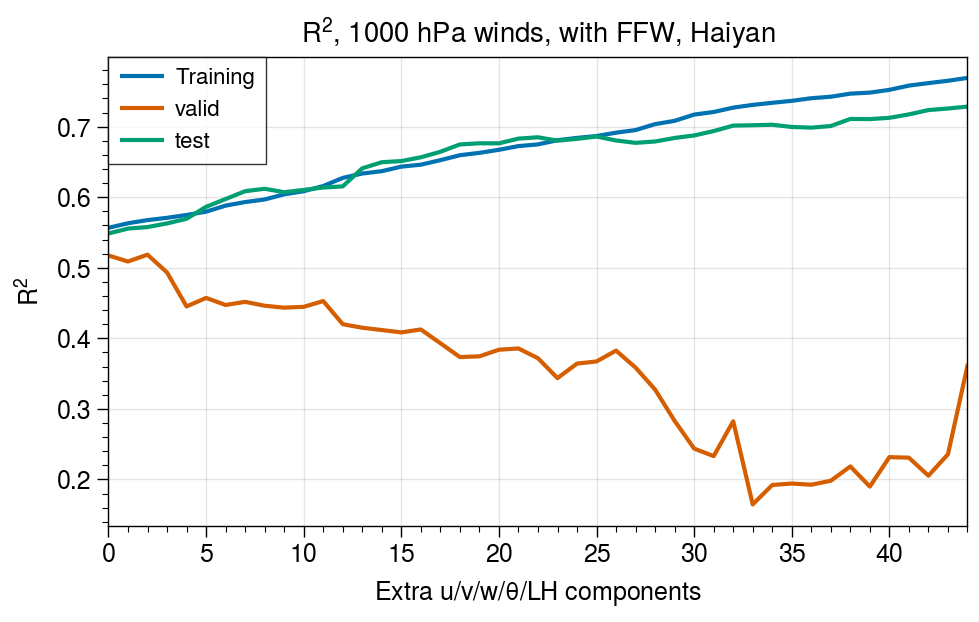

In [32]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.295,refaspect=1.831)
axs[0].plot(r2_train,label='Training')
axs[0].plot(r2_valid,label='valid')
axs[0].plot(r2_test,label='test')
axs.legend(loc='ul',prop={'size':8},ncols=1)
axs[0].format(xlabel=r'Extra u/v/w/$\theta$/LH components',ylabel='R$^{2}$',title='R$^{2}$, 1000 hPa winds, with FFW, Haiyan')
plt.savefig('../../figures/0406/r2_withFFW_haiyan.png',dpi=300)
plt.show()

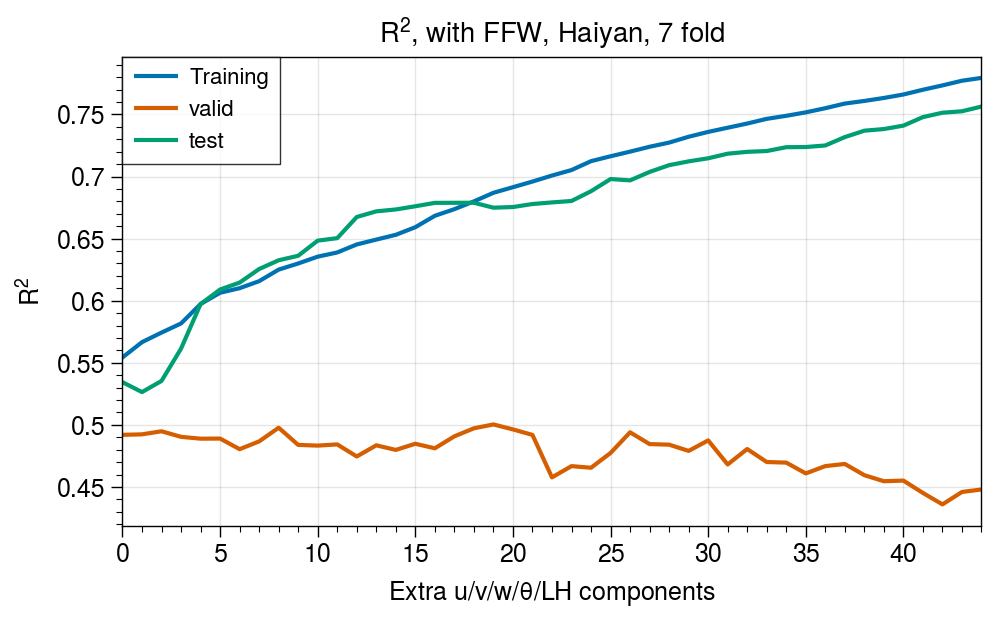

In [19]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.295,refaspect=1.831)
axs[0].plot(r2_train,label='Training')
axs[0].plot(r2_valid,label='valid')
axs[0].plot(r2_test,label='test')
axs.legend(loc='ul',prop={'size':8},ncols=1)
axs[0].format(xlabel=r'Extra u/v/w/$\theta$/LH components',ylabel='R$^{2}$',title='R$^{2}$, uv winds, with FFW, Haiyan, 7 fold, 6 Hr FW')
plt.savefig('../../figures/0406/r2_withFFW_haiyan_alluv_7fold_6hr.png',dpi=300)
plt.show()

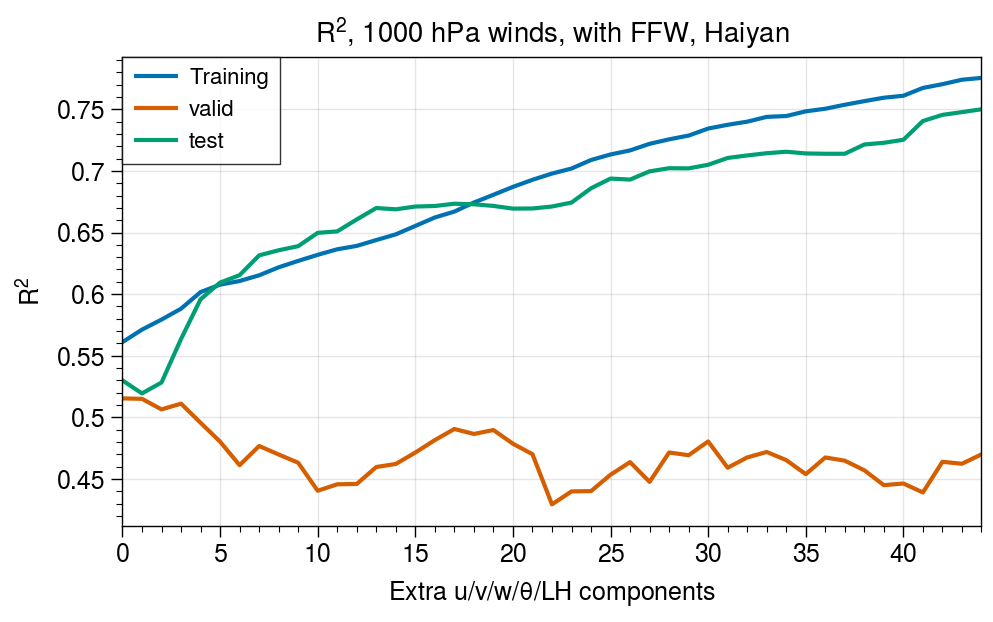

In [26]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.295,refaspect=1.831)
#labels = ['93% Q[29]','95% Q[36]','97% Q[46]','98% Q[53]','99% Q[63]']
axs[0].plot(r2_train,label='Training')
axs[0].plot(r2_valid,label='valid')
axs[0].plot(r2_test,label='test')
#adjust_spines(axs[0], ['left', 'bottom'])
axs.legend(loc='ul',prop={'size':8},ncols=1)
axs[0].format(xlabel=r'Extra u/v/w/$\theta$/LH components',ylabel='R$^{2}$',title='R$^{2}$, 1000 hPa winds, with FFW, Haiyan')
#plt.savefig('./figures/0308/r2_noFFS_more.png',dpi=300)
plt.savefig('../../figures/0406/r2_withFFW_haiyan_7fold.png',dpi=300)
plt.show()